In [17]:
# Adapted from the skimage blob detector example code

from math import sqrt
from skimage import filters
from skimage import data
from skimage.feature import blob_dog, blob_log, blob_doh
from skimage.color import rgb2gray
from scipy.misc import imread
import matplotlib.pyplot as plt
from skimage.exposure import equalize_adapthist

import os

%matplotlib inline

In [18]:
source_dir = '/nas/volume1/2photon/RESDATA/TEFO/20161219_JR030W/average_volumes'
avg_vol_dir = 'avg_frames_conditions_channel01'

avg_slices = os.listdir(os.path.join(source_dir, avg_vol_dir))
avg_slices = [i for i in avg_slices if i.endswith('.tif')]
print len(avg_slices)

30


In [125]:

import cv2 
import numpy as np


In [146]:
# Read the image

currslice = 13 #20
image = cv2.imread(os.path.join(source_dir, avg_vol_dir, avg_slices[currslice]), -1)
print image.shape

(120, 120)


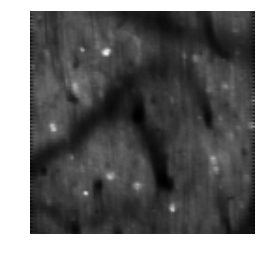

In [147]:
plt.imshow(image, cmap='gray'); plt.axis('off'); plt.show()

In [148]:
# Gaussian blur
image_gaussian = filters.gaussian(image, sigma=1)

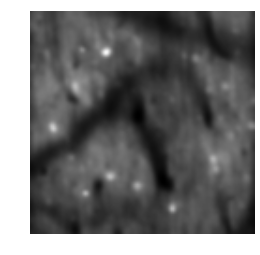

In [149]:
plt.imshow(image_gaussian, cmap='gray'); plt.axis('off'); plt.show()

In [150]:
# CLAHE
image_processed = equalize_adapthist(image_gaussian, kernel_size=10)

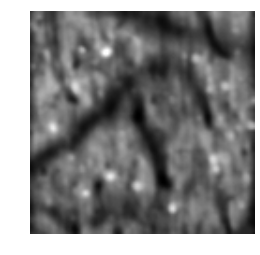

In [151]:
plt.imshow(image_processed, cmap='gray'); plt.axis('off'); plt.show()

In [152]:
max_sigma_val = 2
min_sigma_val = 0.2

In [153]:
# Laplacian of Gaussians
# blobs_log = blob_log(image_processed, max_sigma=6, min_sigma=3, threshold=.01)
blobs_log = blob_log(image_processed, max_sigma=max_sigma_val, min_sigma=min_sigma_val, threshold=.005)

blobs_log[:, 2] = blobs_log[:, 2] * sqrt(2) # Compute radii in the 3rd column.

In [154]:
# Difference of Gaussians
blobs_dog = blob_dog(image_processed, max_sigma=max_sigma_val, min_sigma=min_sigma_val, threshold=.005)
blobs_dog[:, 2] = blobs_dog[:, 2] * sqrt(2)

Slice13_ROIs_avg_frames_conditions_channel01.png


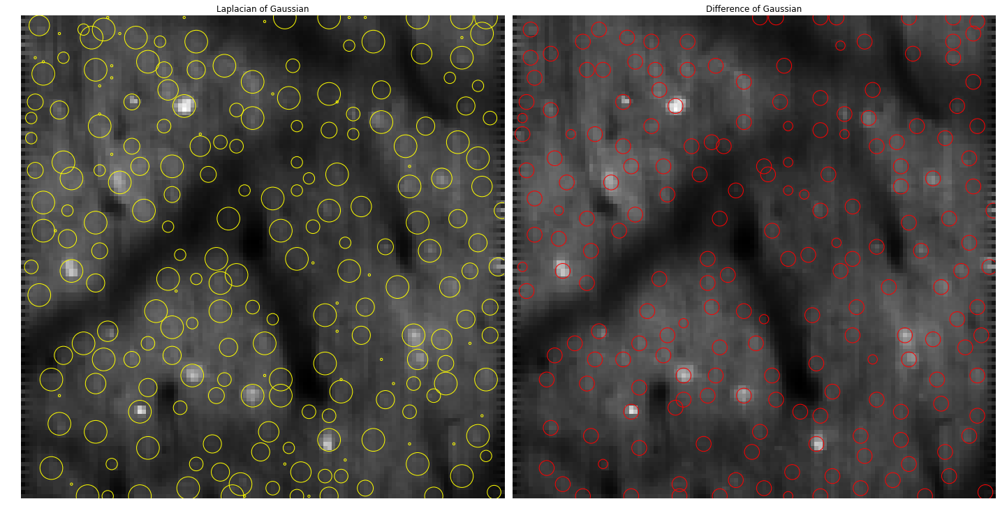

In [155]:
# Plot that shit

blobs_list = [blobs_log, blobs_dog]
colors = ['yellow', 'red']
titles = ['Laplacian of Gaussian', 'Difference of Gaussian']
sequence = zip(blobs_list, colors, titles)

fig, axes = plt.subplots(1, 2, figsize=(20, 10), sharex=True, sharey=True,
                         subplot_kw={'adjustable': 'box-forced'})
ax = axes.ravel()

for idx, (blobs, color, title) in enumerate(sequence):
    ax[idx].set_title(title)
    ax[idx].imshow(image, interpolation='nearest', cmap='gray')
    for blob in blobs:
        y, x, r = blob
        c = plt.Circle((x, y), r, color=color, linewidth=1, fill=False)
        ax[idx].add_patch(c)
    ax[idx].set_axis_off()

plt.tight_layout()

imname = 'Slice%02d_ROIs_%s.png' % (currslice, avg_vol_dir)
print imname

roi_dir = 'ROIs_%s' % avg_vol_dir
if not os.path.exists(os.path.join(source_dir, roi_dir)):
    os.mkdir(os.path.join(source_dir, roi_dir))
    
plt.savefig(os.path.join(source_dir, roi_dir, imname))

plt.show()

## Process all slices:

slice1
(120, 120)
Slice01_ROIs_avg_frames_conditions_channel01.png


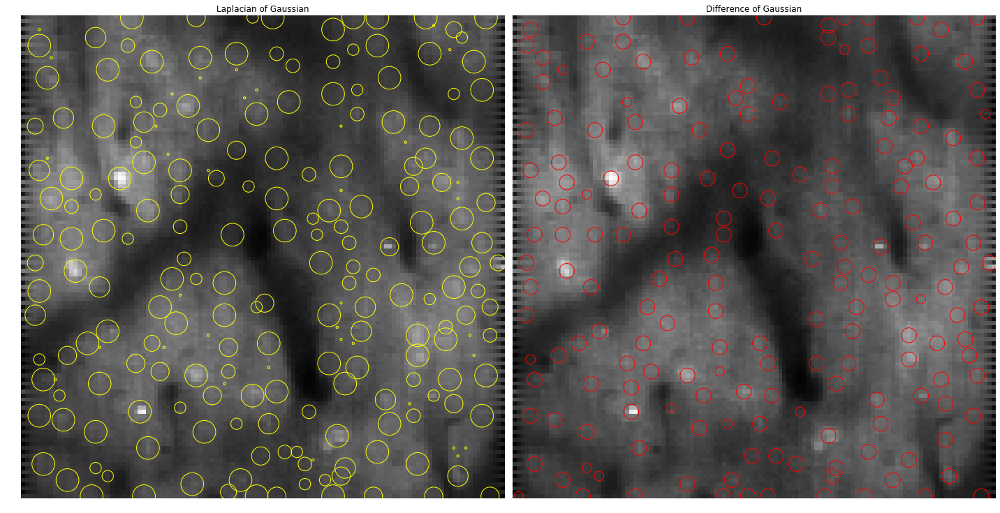

slice2
(120, 120)
Slice02_ROIs_avg_frames_conditions_channel01.png


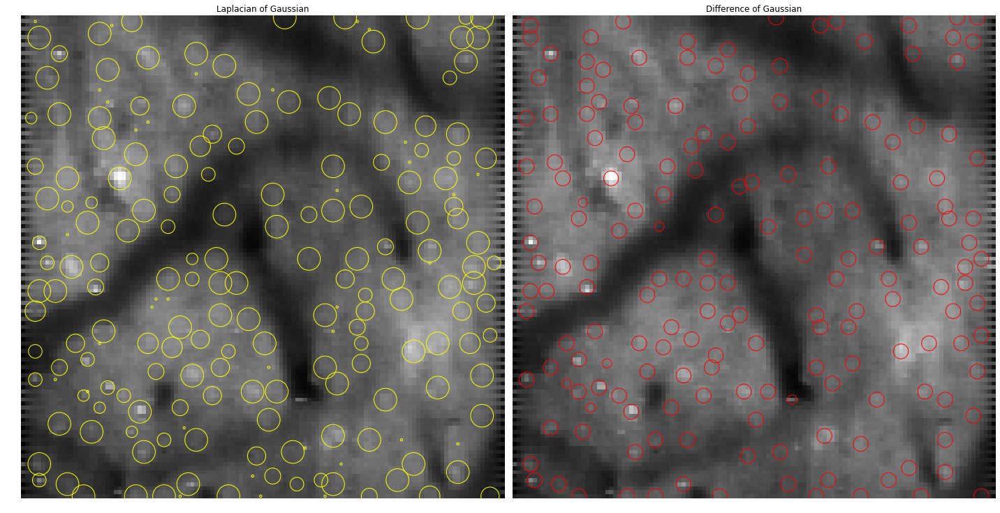

slice3
(120, 120)
Slice03_ROIs_avg_frames_conditions_channel01.png


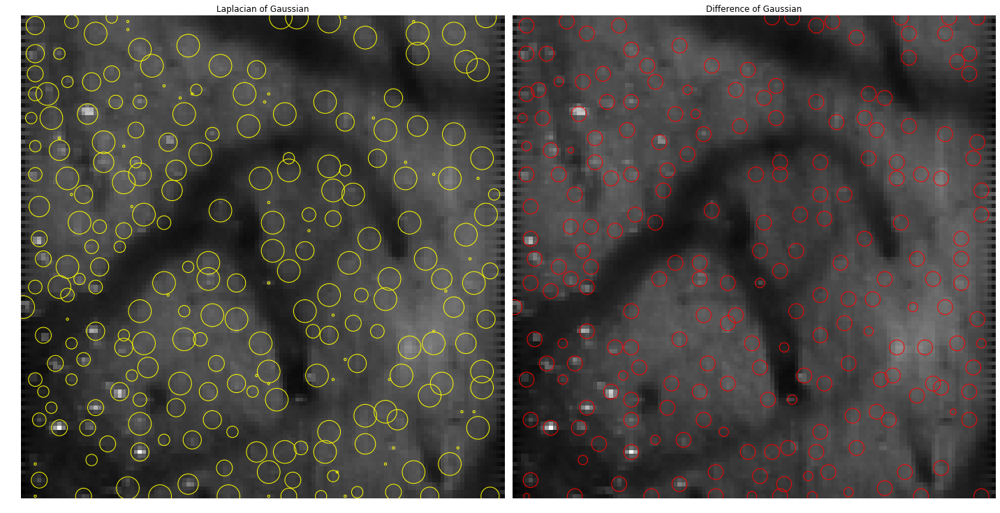

slice4
(120, 120)
Slice04_ROIs_avg_frames_conditions_channel01.png


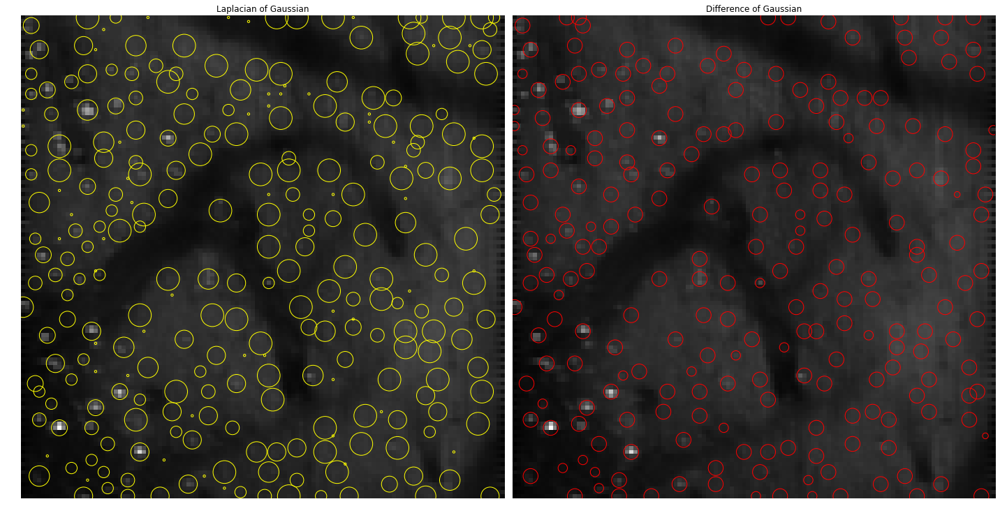

slice5
(120, 120)
Slice05_ROIs_avg_frames_conditions_channel01.png


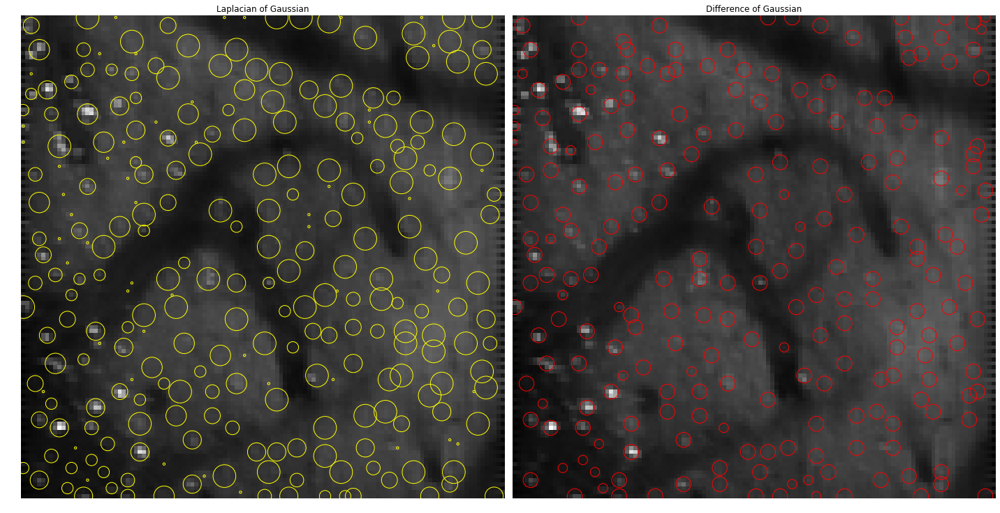

slice6
(120, 120)
Slice06_ROIs_avg_frames_conditions_channel01.png


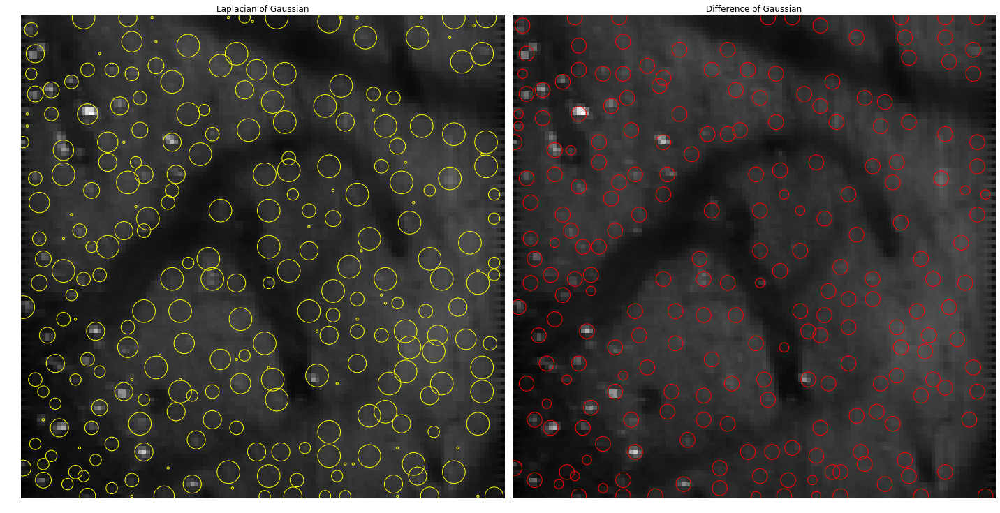

slice7
(120, 120)
Slice07_ROIs_avg_frames_conditions_channel01.png


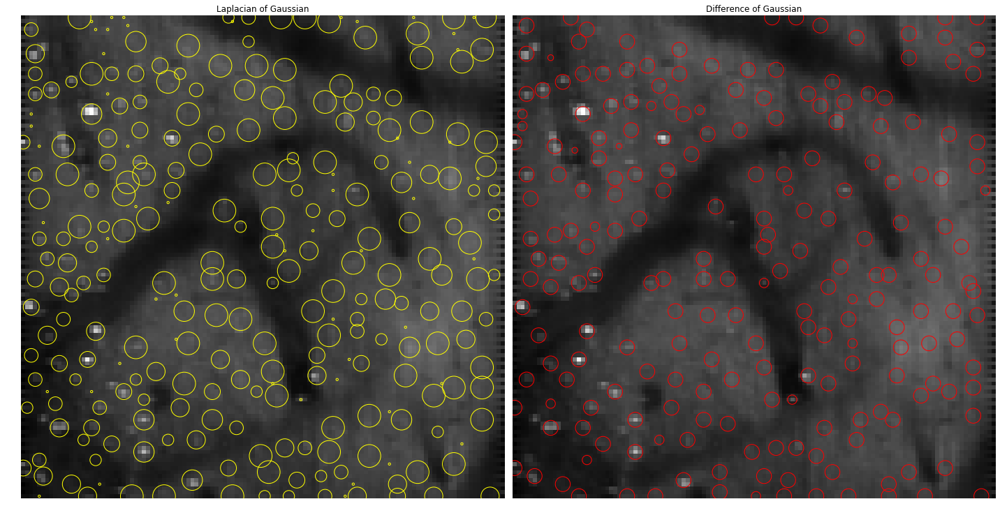

slice8
(120, 120)
Slice08_ROIs_avg_frames_conditions_channel01.png


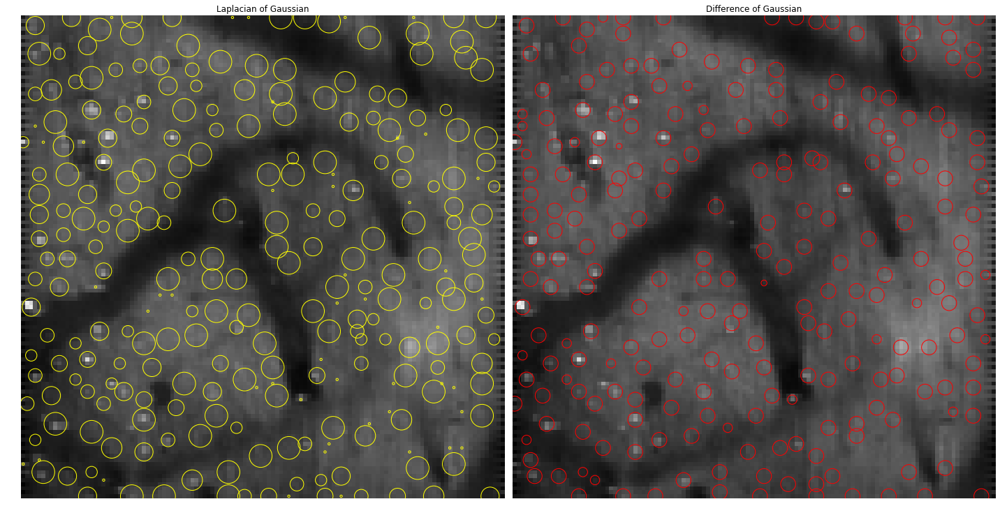

slice9
(120, 120)
Slice09_ROIs_avg_frames_conditions_channel01.png


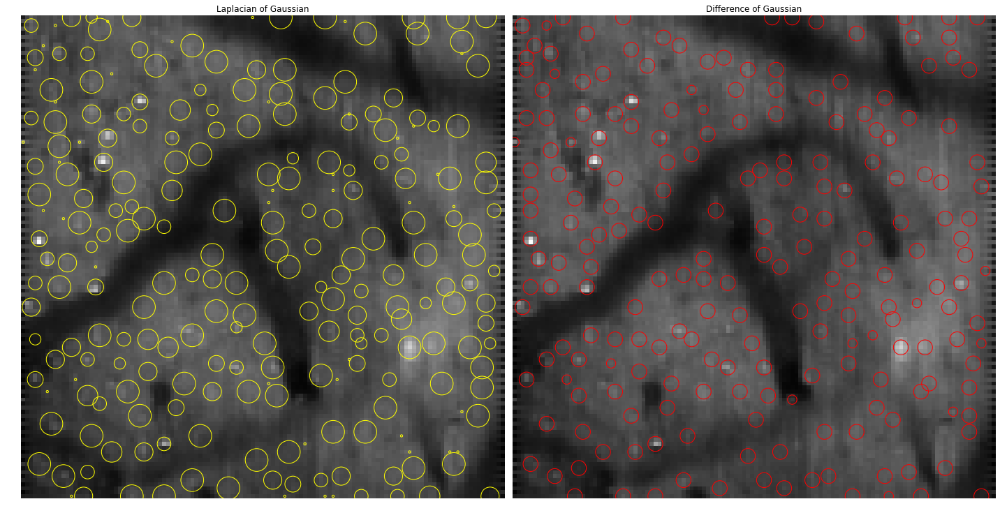

slice10
(120, 120)
Slice10_ROIs_avg_frames_conditions_channel01.png


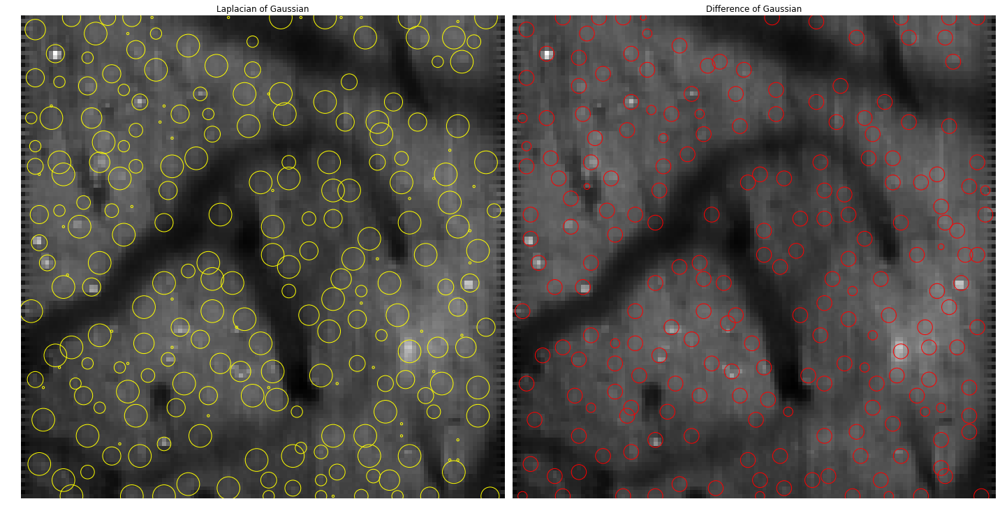

slice11
(120, 120)
Slice11_ROIs_avg_frames_conditions_channel01.png


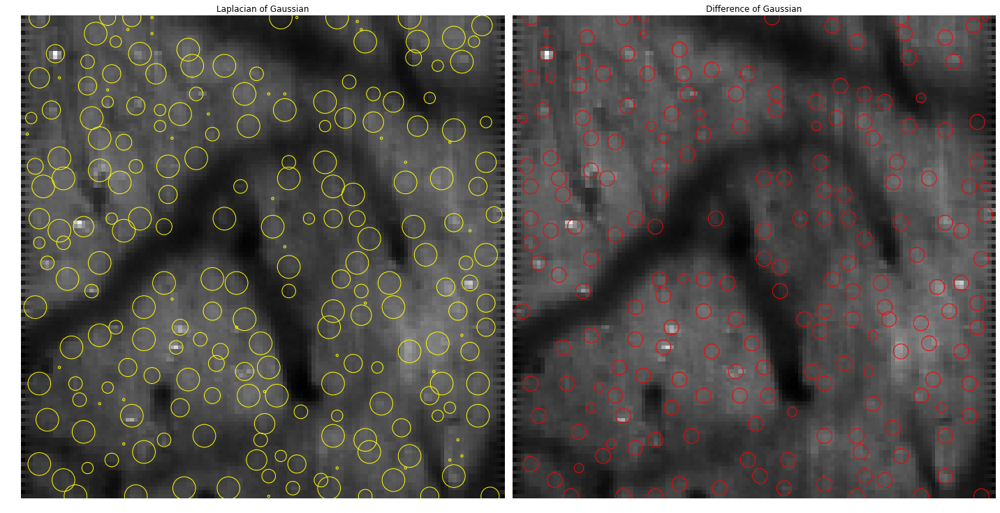

slice12
(120, 120)
Slice12_ROIs_avg_frames_conditions_channel01.png


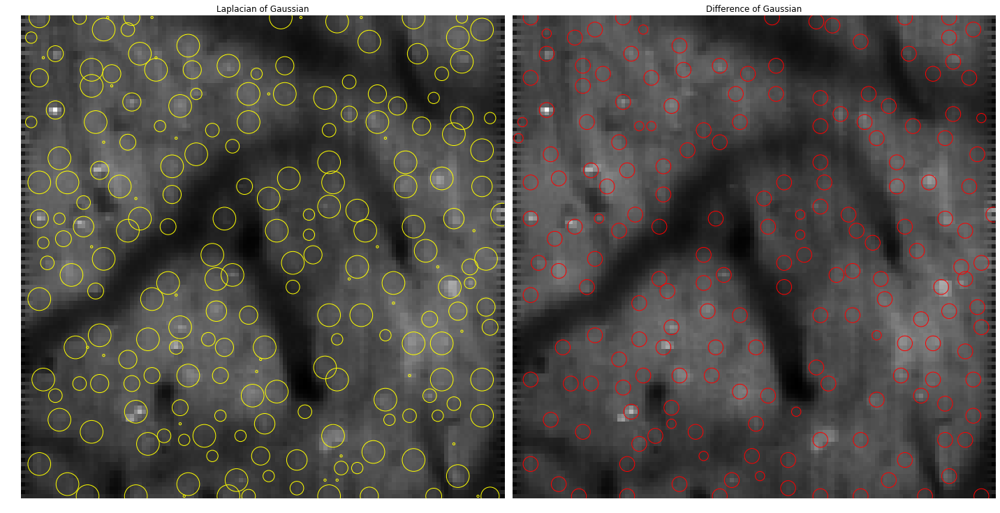

slice13
(120, 120)
Slice13_ROIs_avg_frames_conditions_channel01.png


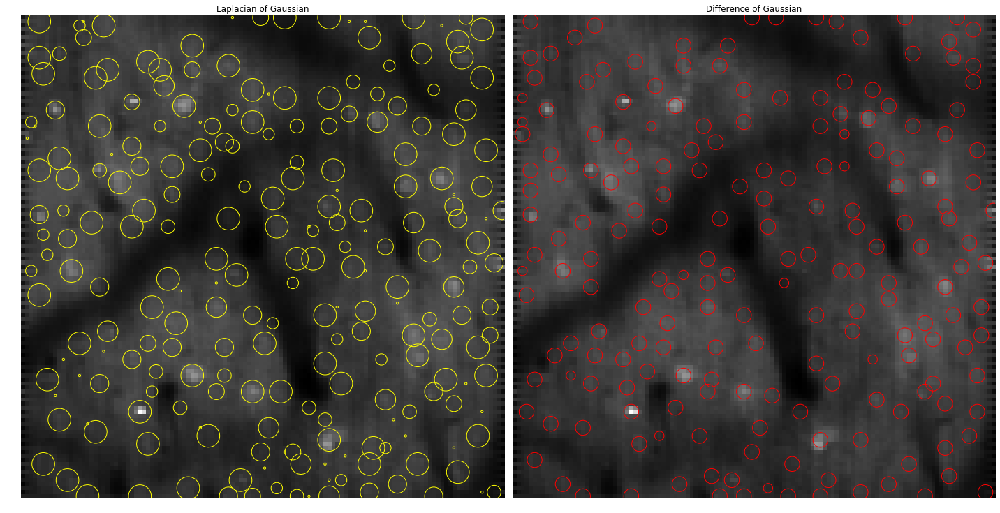

slice14
(120, 120)
Slice14_ROIs_avg_frames_conditions_channel01.png


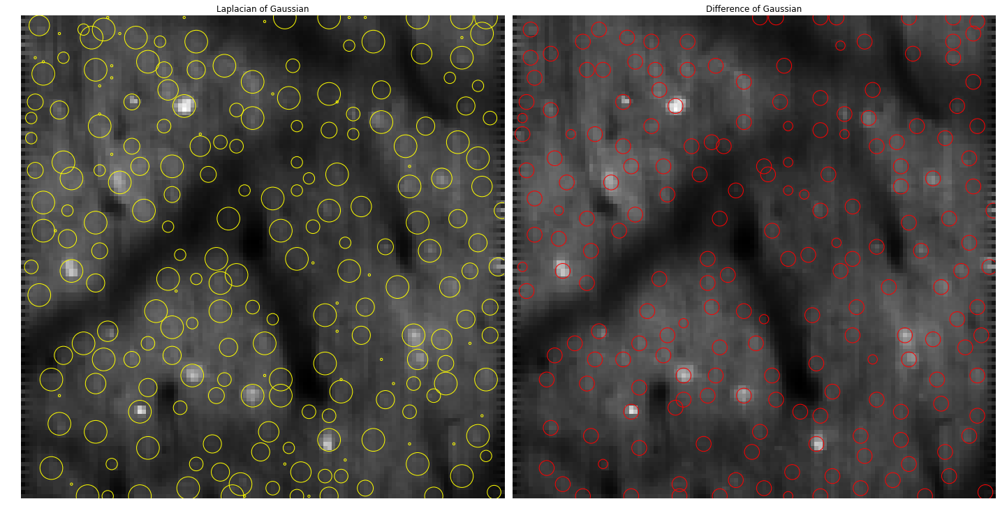

slice15
(120, 120)
Slice15_ROIs_avg_frames_conditions_channel01.png


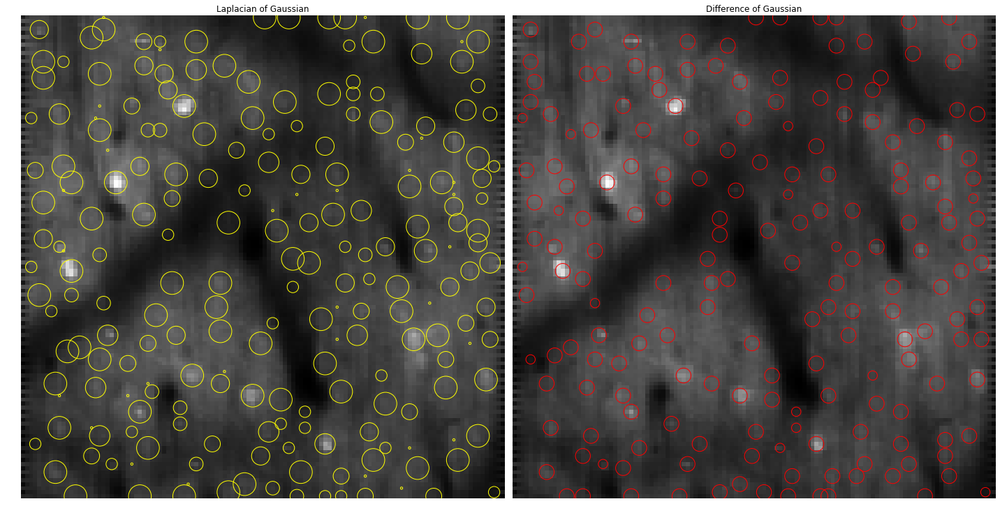

slice16
(120, 120)
Slice16_ROIs_avg_frames_conditions_channel01.png


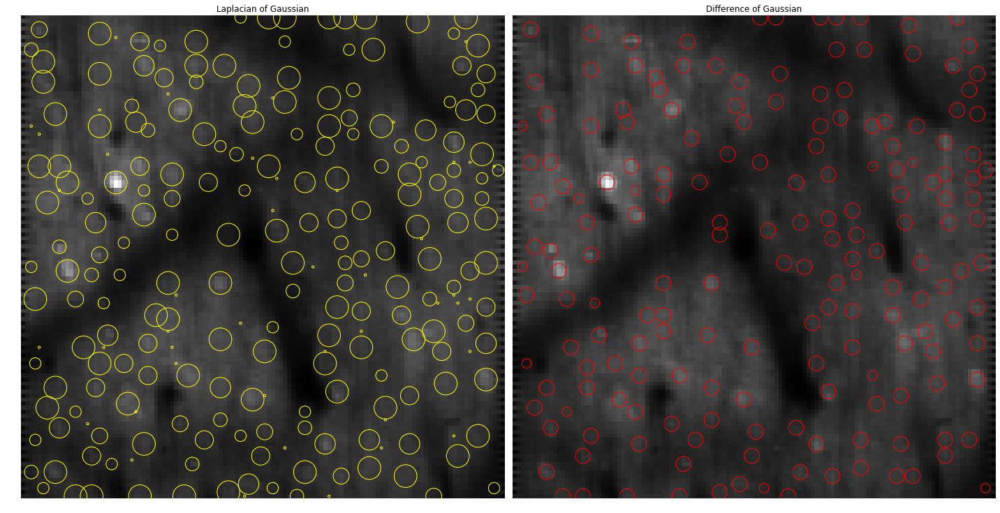

slice17
(120, 120)
Slice17_ROIs_avg_frames_conditions_channel01.png


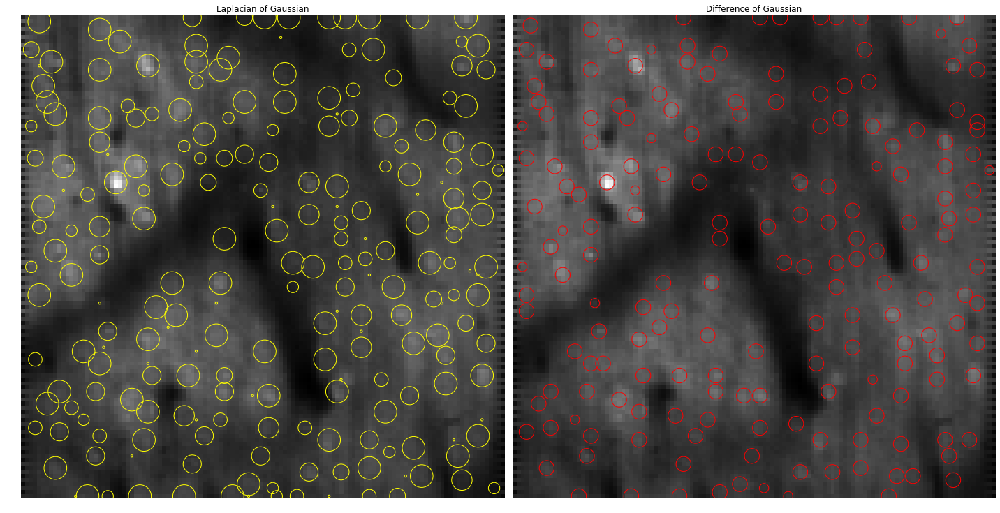

slice18
(120, 120)
Slice18_ROIs_avg_frames_conditions_channel01.png


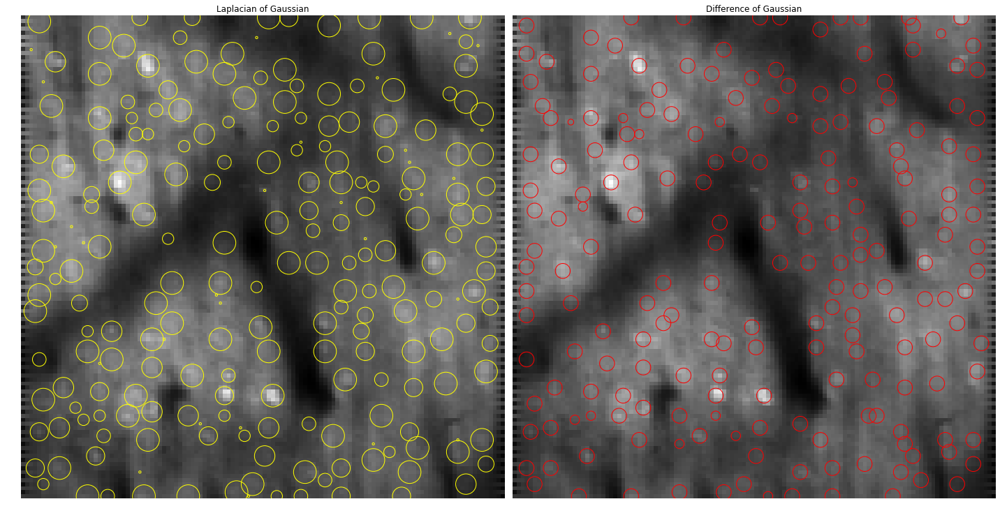

slice19
(120, 120)
Slice19_ROIs_avg_frames_conditions_channel01.png


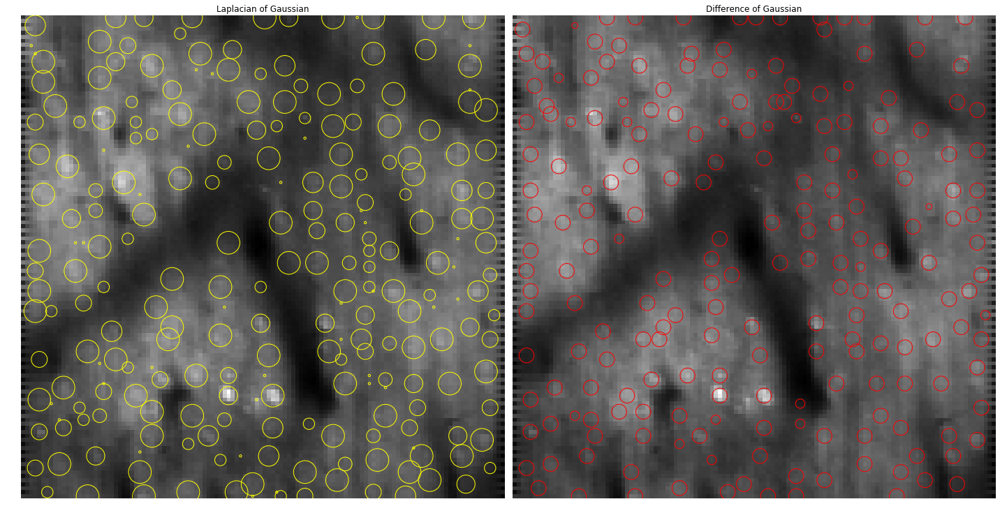

slice20
(120, 120)
Slice20_ROIs_avg_frames_conditions_channel01.png


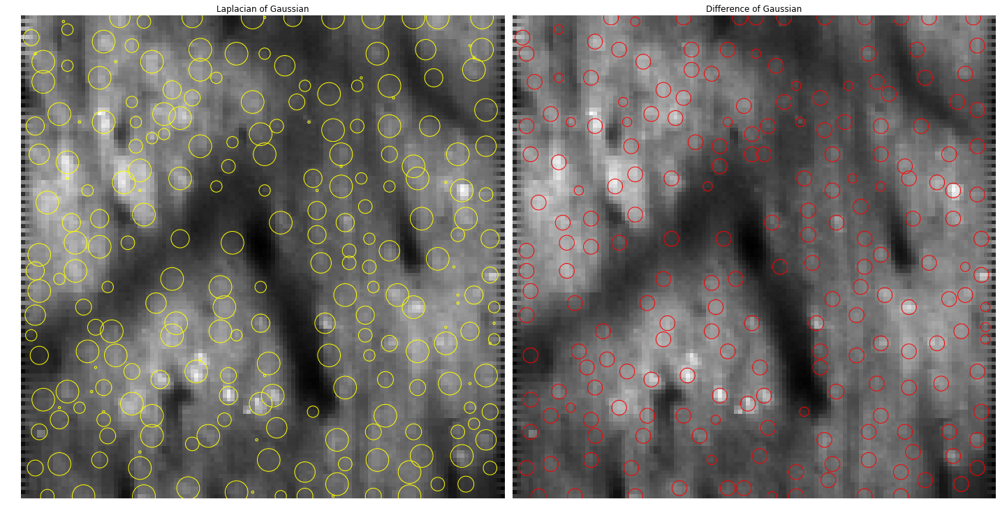

slice21
(120, 120)
Slice21_ROIs_avg_frames_conditions_channel01.png


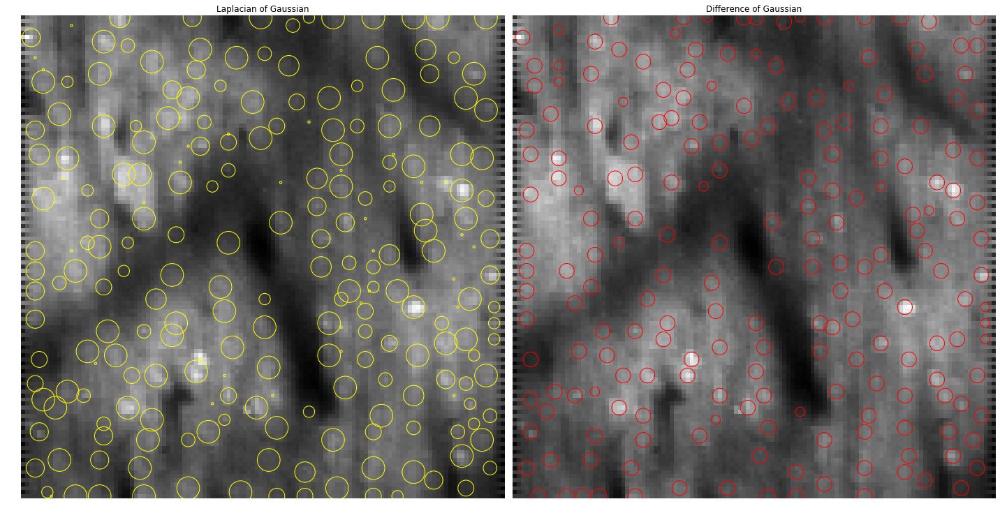

slice22
(120, 120)
Slice22_ROIs_avg_frames_conditions_channel01.png


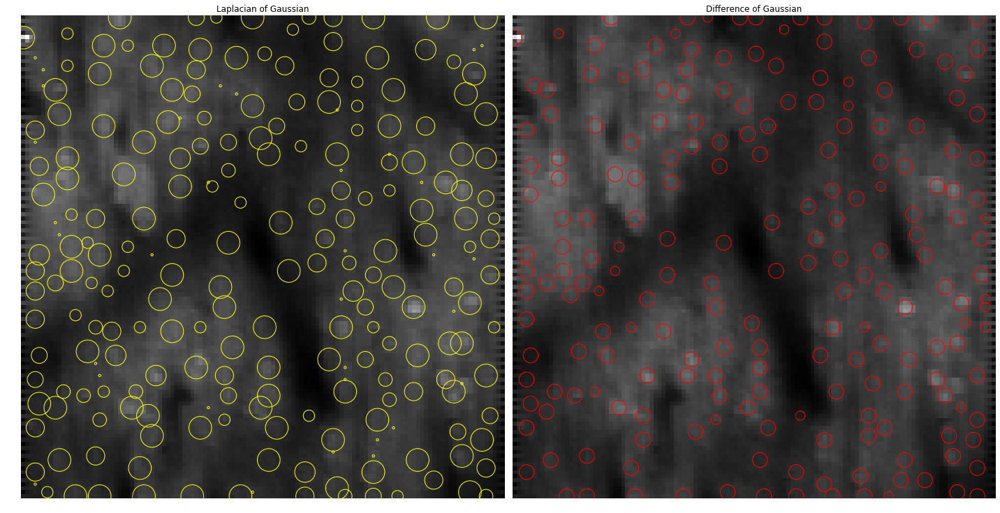

slice23
(120, 120)
Slice23_ROIs_avg_frames_conditions_channel01.png


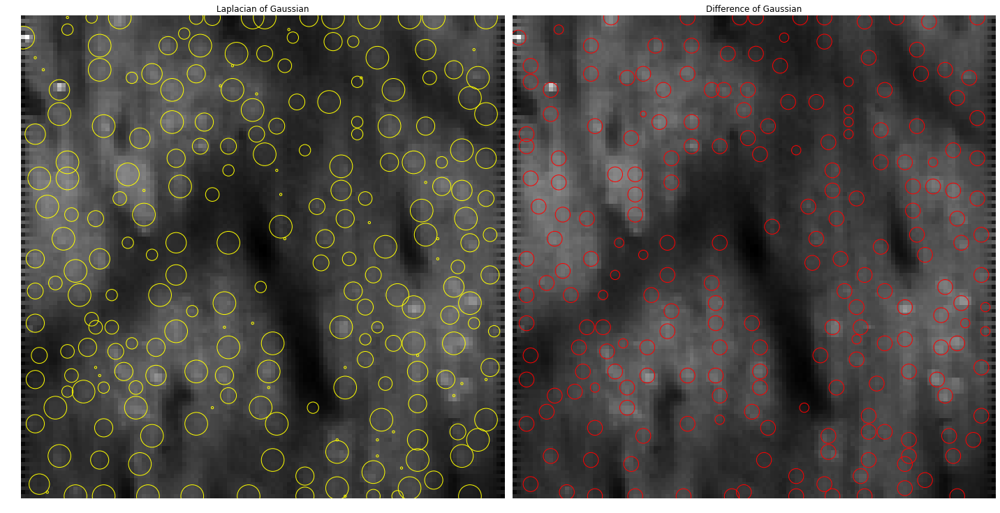

slice24
(120, 120)
Slice24_ROIs_avg_frames_conditions_channel01.png


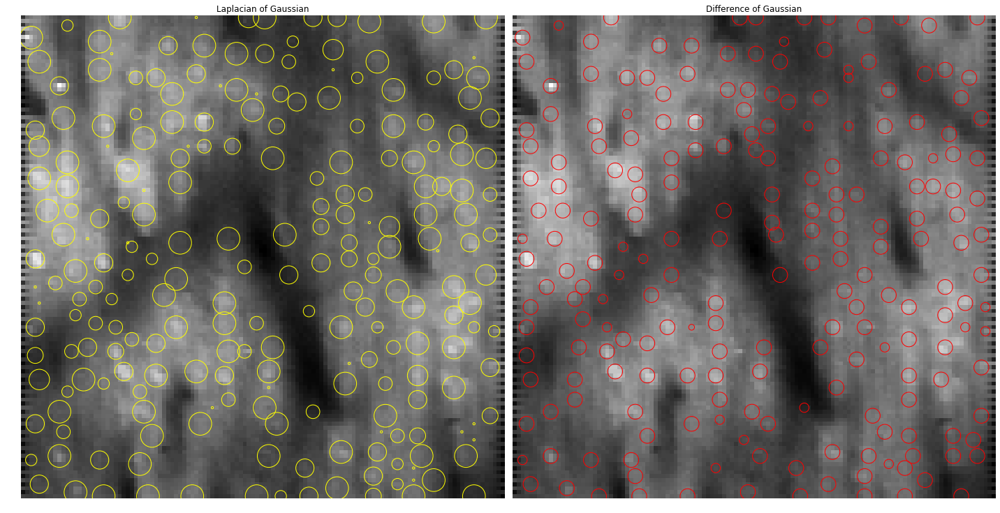

slice25
(120, 120)
Slice25_ROIs_avg_frames_conditions_channel01.png


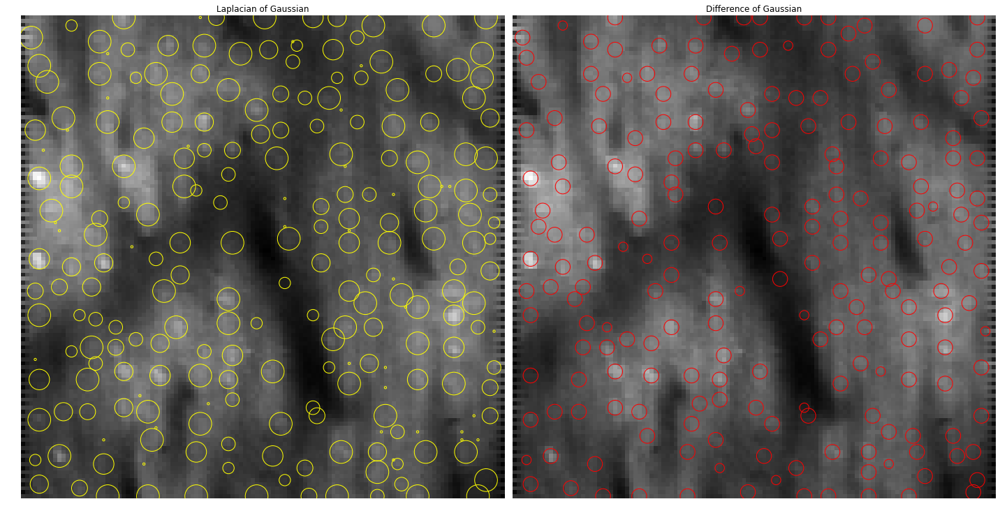

slice26
(120, 120)
Slice26_ROIs_avg_frames_conditions_channel01.png


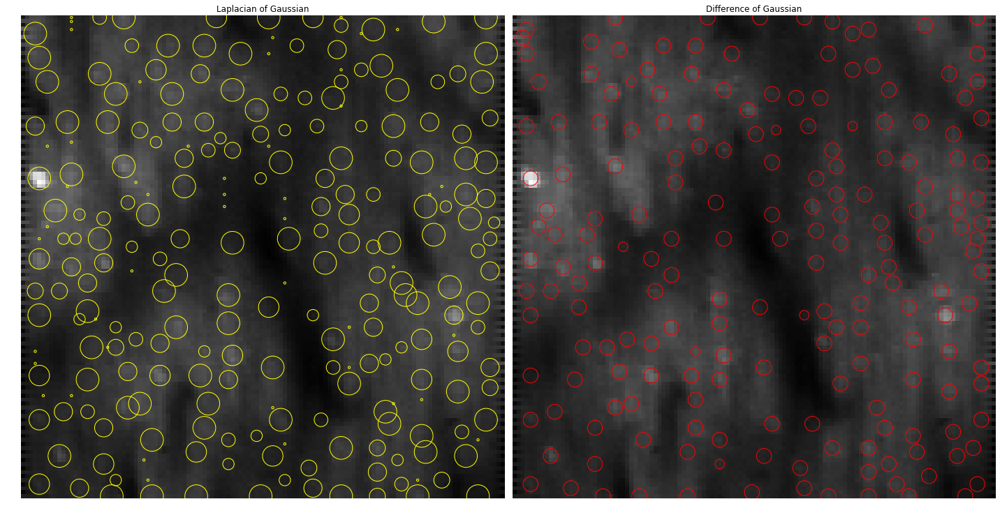

slice27
(120, 120)
Slice27_ROIs_avg_frames_conditions_channel01.png


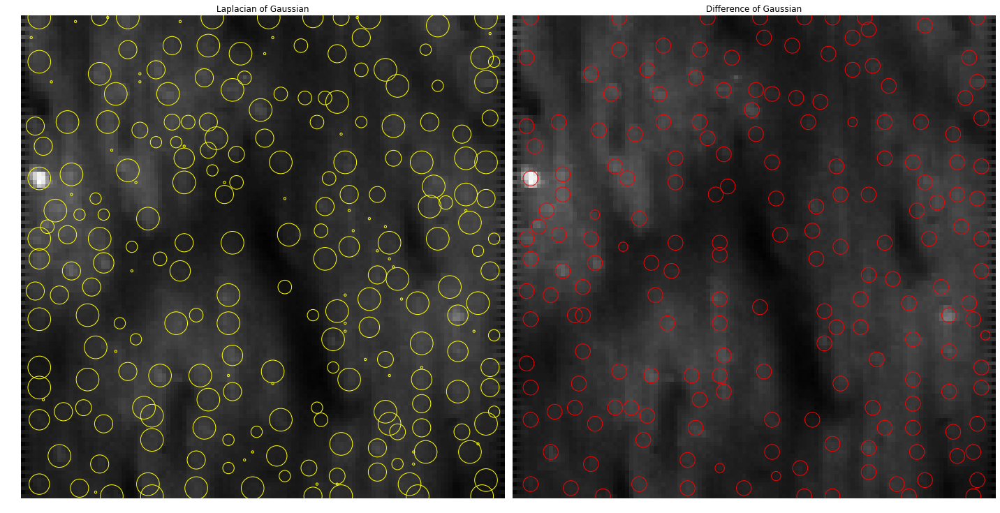

slice28
(120, 120)
Slice28_ROIs_avg_frames_conditions_channel01.png


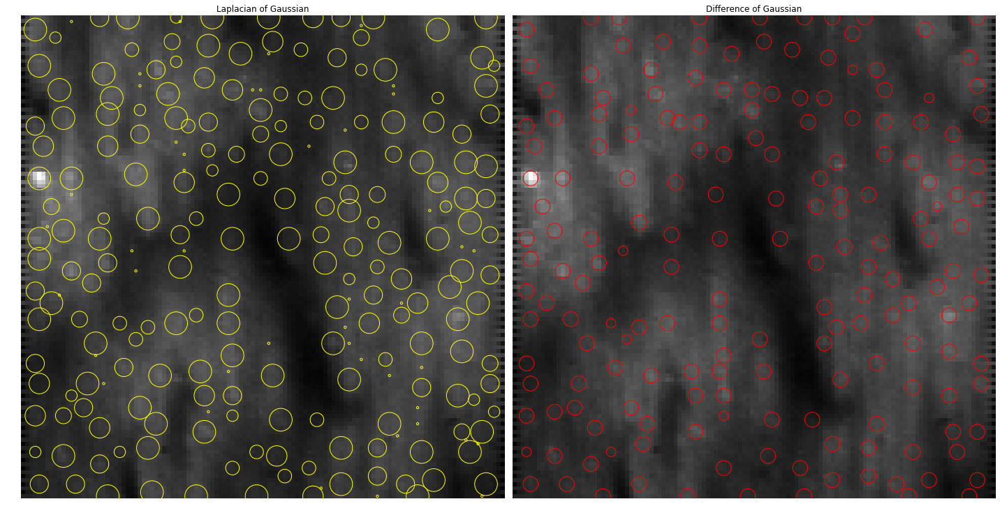

slice29
(120, 120)
Slice29_ROIs_avg_frames_conditions_channel01.png


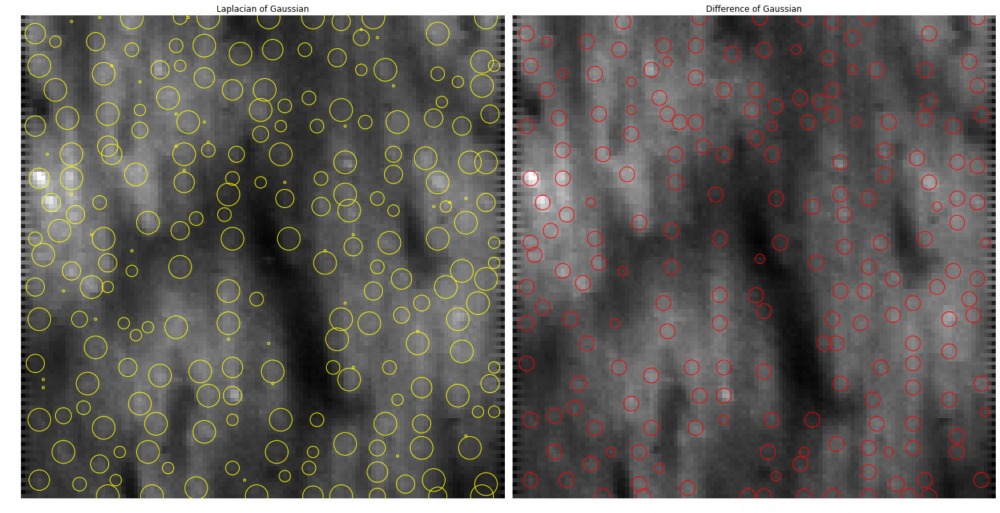

slice30
(120, 120)
Slice30_ROIs_avg_frames_conditions_channel01.png


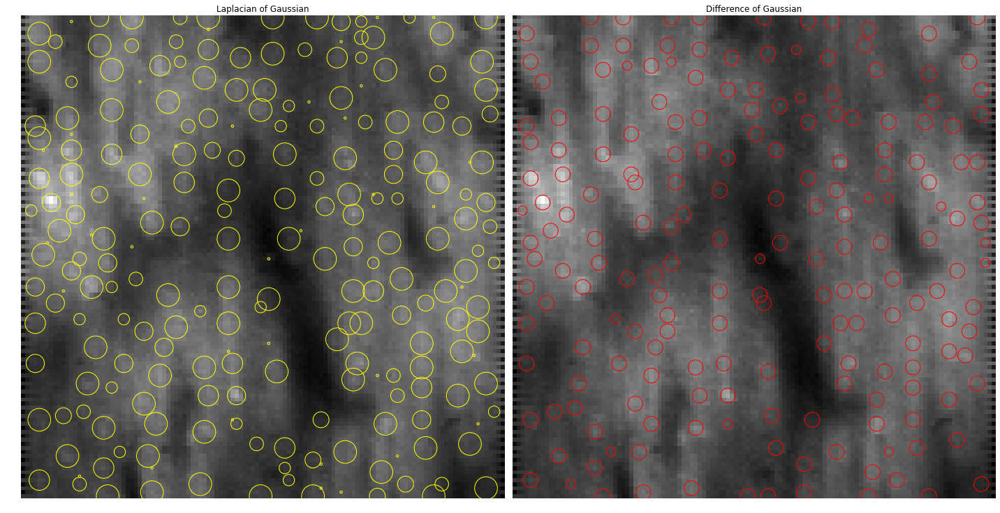

In [164]:

rois = dict()
nslices = 30

max_sigma_val = 2
min_sigma_val = 0.2

for currslice in range(nslices):

    currslice_name = 'slice%i' % int(currslice+1)
    print currslice_name
    rois[currslice_name] = dict()

    # Read the image
    image = cv2.imread(os.path.join(source_dir, avg_vol_dir, avg_slices[currslice]), -1)
    print image.shape

    # Gaussian blur
    image_gaussian = filters.gaussian(image, sigma=1)

    # CLAHE
    image_processed = equalize_adapthist(image_gaussian, kernel_size=10)

    # Laplacian of Gaussians
    # blobs_log = blob_log(image_processed, max_sigma=6, min_sigma=3, threshold=.01)
    blobs_log = blob_log(image_processed, max_sigma=max_sigma_val, min_sigma=min_sigma_val, threshold=.005)

    blobs_log[:, 2] = blobs_log[:, 2] * sqrt(2) # Compute radii in the 3rd column.

    # Difference of Gaussians
    blobs_dog = blob_dog(image_processed, max_sigma=max_sigma_val, min_sigma=min_sigma_val, threshold=.005)
    blobs_dog[:, 2] = blobs_dog[:, 2] * sqrt(2)

    # Save in array
    rois['slice%i' % (currslice+1)]['LoG'] = blobs_log
    rois['slice%i' % (currslice+1)]['DoG'] = blobs_dog


    # Plot that shit

    blobs_list = [blobs_log, blobs_dog]
    colors = ['yellow', 'red']
    titles = ['Laplacian of Gaussian', 'Difference of Gaussian']
    sequence = zip(blobs_list, colors, titles)

    fig, axes = plt.subplots(1, 2, figsize=(20, 10), sharex=True, sharey=True,
                             subplot_kw={'adjustable': 'box-forced'})
    ax = axes.ravel()

    for idx, (blobs, color, title) in enumerate(sequence):
        ax[idx].set_title(title)
        ax[idx].imshow(image, interpolation='nearest', cmap='gray')
        for blob in blobs:
            y, x, r = blob
            c = plt.Circle((x, y), r, color=color, linewidth=1, fill=False)
            ax[idx].add_patch(c)
        ax[idx].set_axis_off()

    plt.tight_layout()

    imname = 'Slice%02d_ROIs_%s.png' % (currslice+1, avg_vol_dir)
    print imname

    roi_dir = 'ROIs_%s' % avg_vol_dir
    if not os.path.exists(os.path.join(source_dir, roi_dir)):
        os.mkdir(os.path.join(source_dir, roi_dir))

    plt.savefig(os.path.join(source_dir, roi_dir, imname))

    plt.show()
    

In [166]:
import scipy.io
roi_mat_fn = 'rois_%s.mat' % avg_vol_dir
scipy.io.savemat(os.path.join(source_dir, roi_mat_fn), mdict=rois)
print os.path.join(source_dir, roi_mat_fn)

/nas/volume1/2photon/RESDATA/TEFO/20161219_JR030W/average_volumes/rois_avg_frames_conditions_channel01.mat


In [171]:
int(rois.keys()[0][5:])

30

In [176]:
all_centroids_log = [(rois[slicekey]['LoG'][:,1], rois[slicekey]['LoG'][:,0], int(slicekey[5:])] for slicekey in rois.keys()]

In [190]:
centroids = dict()
centroids['LoG'] = []
centroids['DoG'] = []

for slicekey in rois.keys():
    centroids1 = [[rois[slicekey]['LoG'][r,1], rois[slicekey]['LoG'][r,0], int(slicekey[5:])] for r in range(rois[slicekey]['LoG'].shape[0])]
    centroids2 = [[rois[slicekey]['DoG'][r,1], rois[slicekey]['DoG'][r,0], int(slicekey[5:])] for r in range(rois[slicekey]['DoG'].shape[0])]

    centroids['LoG'].append(centroids1)
    centroids['DoG'].append(centroids2)

In [191]:
import itertools
centroids['LoG'] = list(itertools.chain.from_iterable(centroids['LoG']))
centroids['DoG'] = list(itertools.chain.from_iterable(centroids['DoG']))

In [193]:
len(centroids['LoG'])

7114

In [194]:

centroids_mat_fn = 'centroids_%s.mat' % avg_vol_dir
scipy.io.savemat(os.path.join(source_dir, centroids_mat_fn), mdict=centroids)
print os.path.join(source_dir, centroids_mat_fn)

/nas/volume1/2photon/RESDATA/TEFO/20161219_JR030W/average_volumes/centroids_avg_frames_conditions_channel01.mat
